In [2]:
# Importemos las librerias
import pandas as pd
import matplotlib.pyplot as plt
import os
from pandas import DataFrame
import numpy as np
import cv2
import shutil
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import tensorflow as tf
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import seaborn as sns
from joblib import Parallel, delayed

In [2]:
os.listdir("../DataSetPatrones")

['.ipynb_checkpoints',
 'COVID',
 'COVID_FE',
 'COVID_FExtractor',
 'Lung_Opacity',
 'Lung_Opacity_FE',
 'Lung_Opacity_FExtractor',
 'metadata.csv',
 'MetadataNormalizada.csv',
 'MetadataNormalizadaFE.csv',
 'New_metadata.csv',
 'Normal',
 'Normal_FE',
 'Normal_FExtractor',
 'Pneumonia',
 'Pneumonia_FE',
 'Pneumonia_FExtractor',
 'X_Data']

In [2]:
######################################## Restaurar las imagenes a sus valores originales ########################################

# Definir los directorios que contienen los diferentes tipos de imágenes
dirlist = [
    '../DataSetPatrones/COVID_FExtractor',
    '../DataSetPatrones/Lung_Opacity_FExtractor',
    '../DataSetPatrones/Normal_FExtractor',
    '../DataSetPatrones/Pneumonia_FExtractor'
]

# Crear un diccionario que mapea las etiquetas a los índices
label_map = {
    'covid': 0,
    'lung_opacity': 1,
    'normal': 2,
    'pneumonia': 3
}

# Crear dos listas vacías para almacenar los paths de archivo y las etiquetas
filepaths = []
labels = []

# Iterar a través de los directorios y agregar los paths de archivo y las etiquetas a las listas creadas anteriormente
for idx, d in enumerate(dirlist):
    flist = os.listdir(d)
    for f in flist:
        fpath = os.path.join(d, f)
        filepaths.append(fpath)
        labels.append(list(label_map.keys())[idx])

# Crear un dataframe con los paths de archivo y las etiquetas
df = pd.DataFrame({'file_paths': filepaths, 'labels': labels})

# Reorganizar el dataframe a un formato legible y guardarlo en un archivo CSV
df.to_csv('../DataSetPatrones/MetadataNormalizadaFE.csv', index=False)

# Contar el número de imágenes en cada clase de etiqueta y mostrar los resultados
print(df['labels'].value_counts())

# Mostrar las primeras filas del dataframe
df.head()

labels
lung_opacity    6012
normal          5096
covid           3616
pneumonia       1345
Name: count, dtype: int64


,file_paths,labels
0,../DataSetPatrones/COVID_FExtractor\Covid-0.png,covid
1,../DataSetPatrones/COVID_FExtractor\Covid-1.png,covid
2,../DataSetPatrones/COVID_FExtractor\Covid-10.png,covid
3,../DataSetPatrones/COVID_FExtractor\Covid-100.png,covid
4,../DataSetPatrones/COVID_FExtractor\Covid-1000...,covid


In [3]:
##################################### Vamos a reducir la cantidad de imagenes #####################################

df = pd.read_csv('../DataSetPatrones/MetadataNormalizada.csv')
normal_data = df[df["labels"] == "lung_opacity"]
reduced_normal_data = normal_data.sample(n=3012, random_state=1)
reduced_data = pd.concat([df[df["labels"] != "lung_opacity"], reduced_normal_data])
reduced_data.to_csv("../DataSetPatrones/MetadataNormalizada.csv", index=False)

# Lee el archivo CSV y almacena los datos en un dataframe
df = pd.read_csv('../DataSetPatrones/MetadataNormalizadaFE.csv')

print(" Dataset con FE \n")
print(df['labels'].value_counts())

df = pd.read_csv('../DataSetPatrones/MetadataNormalizada.csv')

print("\n Dataset sin FE \n")
print(df['labels'].value_counts())

####################### Aqui estan las 16k imagenes 



 Dataset con FE 

labels
lung_opacity    6012
normal          5096
covid           3616
pneumonia       1345
Name: count, dtype: int64

 Dataset sin FE 

labels
normal          5096
covid           3616
lung_opacity    3012
pneumonia       1345
Name: count, dtype: int64


# Modelo MLP - Con feature extractor


In [4]:
# Leer el dataset desde un archivo CSV o cargarlo directamente en un DataFrame
df = pd.read_csv('../DataSetPatrones/MetadataNormalizadaFE.csv')

# Dividir los datos en características (X) y etiquetas (y)
X = df['file_paths']
y = df['labels']

# Codificar las etiquetas como valores numéricos
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42,stratify=y)

# Preprocesar los datos de las imágenes en paralelo
#n_jobs son la cantidad de nucleos disponibles en su compu 

def preprocess_image_parallel(file_paths):
    return Parallel(n_jobs=2)(delayed(preprocess_image)(file_path) for file_path in file_paths)

# Preprocesar los datos de las imágenes
def preprocess_image(file_path):
    img = cv2.imread(file_path)
    img = cv2.resize(img, (244, 244))  # Redimensionar las imágenes a 244x244
    img = img / 255.0  # Normalizar los valores de píxeles entre 0 y 1
    return img

X_train = np.array(preprocess_image_parallel(X_train))
X_test = np.array(preprocess_image_parallel(X_test))

Epoch 1/7
402/402 [==============================] - 73s 176ms/step - loss: 2.7865 - accuracy: 0.4296 - val_loss: 1.0180 - val_accuracy: 0.5352
Epoch 2/7
402/402 [==============================] - 32s 81ms/step - loss: 0.9946 - accuracy: 0.5861 - val_loss: 1.0171 - val_accuracy: 0.5672
Epoch 3/7
402/402 [==============================] - 35s 88ms/step - loss: 0.7965 - accuracy: 0.6676 - val_loss: 0.9705 - val_accuracy: 0.5685
Epoch 4/7
402/402 [==============================] - 36s 90ms/step - loss: 0.8428 - accuracy: 0.6683 - val_loss: 0.8002 - val_accuracy: 0.6867
Epoch 5/7
402/402 [==============================] - 36s 89ms/step - loss: 0.6348 - accuracy: 0.7489 - val_loss: 0.8654 - val_accuracy: 0.6683
Epoch 6/7
402/402 [==============================] - 35s 86ms/step - loss: 0.5428 - accuracy: 0.7910 - val_loss: 0.7959 - val_accuracy: 0.7019
Epoch 7/7
101/101 [==============================] - 2s 9ms/step


C:\Users\J. Zaet\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\J. Zaet\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\J. Zaet\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

              precision    recall  f1-score   support

       covid       0.53      0.25      0.34       723
lung_opacity       0.86      0.36      0.51      1203
      normal       0.41      0.96      0.58      1019
   pneumonia       0.00      0.00      0.00       269

    accuracy                           0.50      3214
   macro avg       0.45      0.39      0.36      3214
weighted avg       0.57      0.50      0.45      3214

101/101 [==============================] - 1s 8ms/step


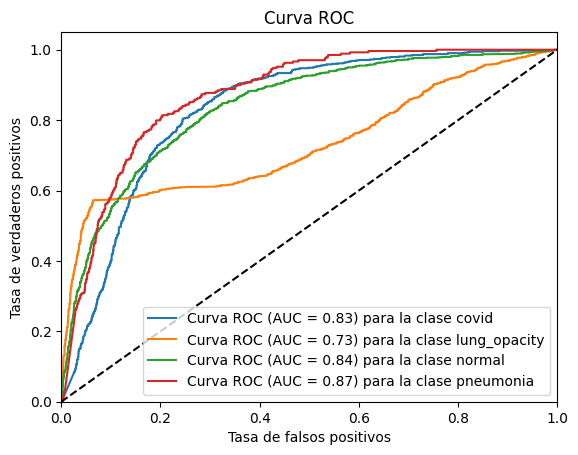

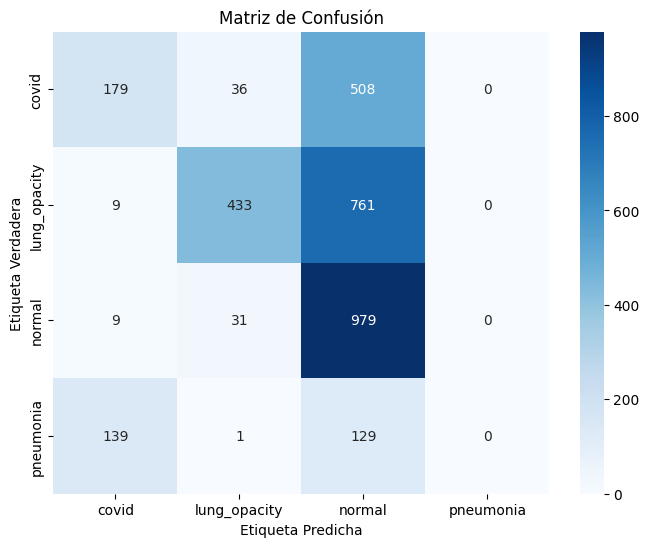

In [6]:
######################################## Primera Arquitectura ########################################
# Crear el modelo MLP
model = tf.keras.Sequential([
    layers.Flatten(input_shape=(244, 244, 3)),  # Aplanar la imagen en un vector 1D
    layers.Dense(64, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(4, activation='softmax')  # 4 clases de etiquetas
])

# Compilar el modelo
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Entrenar el modelo
model.fit(X_train, y_train, epochs=7, batch_size=32, validation_data=(X_test, y_test))

# Predecir las etiquetas para los datos de prueba
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Calcular las métricas para cada clase
report = classification_report(y_test, y_pred_classes, target_names=label_encoder.classes_)

# Imprimir el informe de clasificación
print(report)

# Obtener las probabilidades de predicción para cada clase
y_pred_proba = model.predict(X_test)

fpr = dict()  # Tasa de falsos positivos
tpr = dict()  # Tasa de verdaderos positivos
roc_auc = dict()  # Área bajo la curva (AUC)

# Calcular la curva ROC y el AUC para cada clase
for i in range(4):  # Suponiendo que tienes 4 clases
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Graficar la curva ROC
plt.figure()
for i in range(4):  # Suponiendo que tienes 4 clases
    plt.plot(fpr[i], tpr[i], label='Curva ROC (AUC = %0.2f) para la clase %s' % (roc_auc[i], label_encoder.classes_[i]))
plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred_classes)

# Obtener los nombres de las etiquetas originales
etiquetas_originales = label_encoder.inverse_transform(np.unique(y_test))

# Crear un mapa de calor de la matriz de confusión con etiquetas originales
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=etiquetas_originales, yticklabels=etiquetas_originales)
plt.title('Matriz de Confusión')
plt.xlabel('Etiqueta Predicha')
plt.ylabel('Etiqueta Verdadera')
plt.show()


Epoch 1/7


C:\Users\J. Zaet\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


402/402 [==============================] - 98s 242ms/step - loss: 5.1125 - accuracy: 0.4061 - val_loss: 1.9647 - val_accuracy: 0.4726
Epoch 2/7
402/402 [==============================] - 60s 150ms/step - loss: 1.5844 - accuracy: 0.5319 - val_loss: 0.8930 - val_accuracy: 0.6350
Epoch 3/7
402/402 [==============================] - 59s 147ms/step - loss: 1.0948 - accuracy: 0.5848 - val_loss: 1.3102 - val_accuracy: 0.5317
Epoch 4/7
402/402 [==============================] - 64s 158ms/step - loss: 0.8046 - accuracy: 0.6850 - val_loss: 0.8305 - val_accuracy: 0.6696
Epoch 5/7
402/402 [==============================] - 60s 148ms/step - loss: 0.8087 - accuracy: 0.6912 - val_loss: 0.8589 - val_accuracy: 0.6406
Epoch 6/7
402/402 [==============================] - 57s 141ms/step - loss: 0.7136 - accuracy: 0.7196 - val_loss: 0.8193 - val_accuracy: 0.6886
Epoch 7/7
101/101 [==============================] - 2s 13ms/step
              precision    recall  f1-score   support

       covid       0.36  

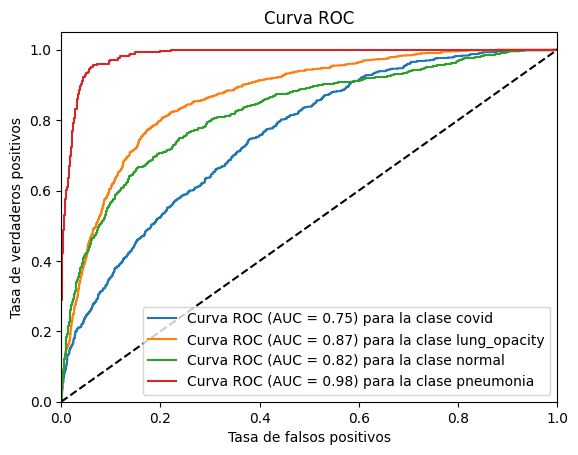

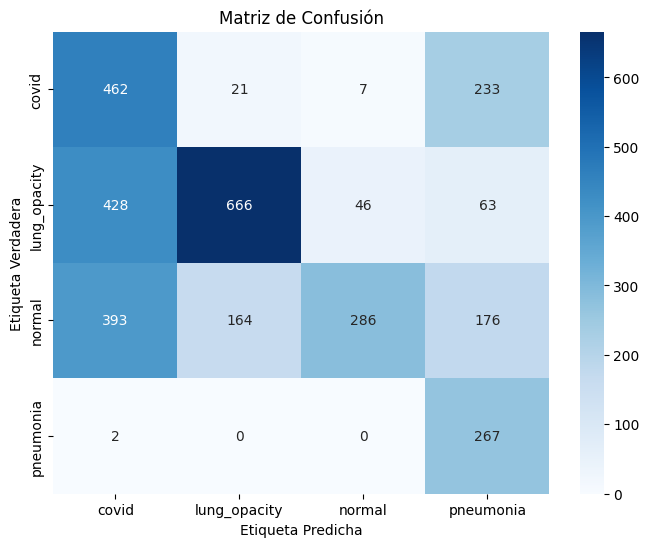

In [7]:
######################################## Segunda Arquitectura ########################################
# Crear el modelo MLP
model = tf.keras.Sequential([
    layers.Flatten(input_shape=(244, 244, 3)),  # Aplanar la imagen en un vector 1D
    layers.Dense(128, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(32, activation="relu"),
    layers.Dense(4, activation='softmax')  # 4 clases de etiquetas
])
# Compilar el modelo
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Entrenar el modelo
model.fit(X_train, y_train, epochs=7, batch_size=32, validation_data=(X_test, y_test))

# Predecir las etiquetas para los datos de prueba
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Calcular las métricas para cada clase
report = classification_report(y_test, y_pred_classes, target_names=label_encoder.classes_)

# Imprimir el informe de clasificación
print(report)

# Obtener las probabilidades de predicción para cada clase
y_pred_proba = model.predict(X_test)

fpr = dict()  # Tasa de falsos positivos
tpr = dict()  # Tasa de verdaderos positivos
roc_auc = dict()  # Área bajo la curva (AUC)

# Calcular la curva ROC y el AUC para cada clase
for i in range(4):  # Suponiendo que tienes 4 clases
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Graficar la curva ROC
plt.figure()
for i in range(4):  # Suponiendo que tienes 4 clases
    plt.plot(fpr[i], tpr[i], label='Curva ROC (AUC = %0.2f) para la clase %s' % (roc_auc[i], label_encoder.classes_[i]))
plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred_classes)

# Obtener los nombres de las etiquetas originales
etiquetas_originales = label_encoder.inverse_transform(np.unique(y_test))

# Crear un mapa de calor de la matriz de confusión con etiquetas originales
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=etiquetas_originales, yticklabels=etiquetas_originales)
plt.title('Matriz de Confusión')
plt.xlabel('Etiqueta Predicha')
plt.ylabel('Etiqueta Verdadera')
plt.show()

Epoch 1/10


C:\Users\J. Zaet\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


402/402 [==============================] - 76s 186ms/step - loss: 1.3173 - accuracy: 0.3649 - val_loss: 1.2779 - val_accuracy: 0.3743
Epoch 2/10
402/402 [==============================] - 58s 143ms/step - loss: 1.2771 - accuracy: 0.3729 - val_loss: 1.2754 - val_accuracy: 0.3743
Epoch 3/10
402/402 [==============================] - 55s 137ms/step - loss: 1.2784 - accuracy: 0.3690 - val_loss: 1.2815 - val_accuracy: 0.3743
Epoch 4/10
402/402 [==============================] - 55s 136ms/step - loss: 1.2780 - accuracy: 0.3721 - val_loss: 1.2762 - val_accuracy: 0.3743
Epoch 5/10
402/402 [==============================] - 55s 137ms/step - loss: 1.2774 - accuracy: 0.3687 - val_loss: 1.2770 - val_accuracy: 0.3743
Epoch 6/10
402/402 [==============================] - 55s 137ms/step - loss: 1.2780 - accuracy: 0.3682 - val_loss: 1.2781 - val_accuracy: 0.3743
Epoch 7/10
402/402 [==============================] - 55s 137ms/step - loss: 1.2783 - accuracy: 0.3736 - val_loss: 1.2762 - val_accuracy: 0.3

C:\Users\J. Zaet\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\J. Zaet\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\J. Zaet\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

101/101 [==============================] - 2s 14ms/step


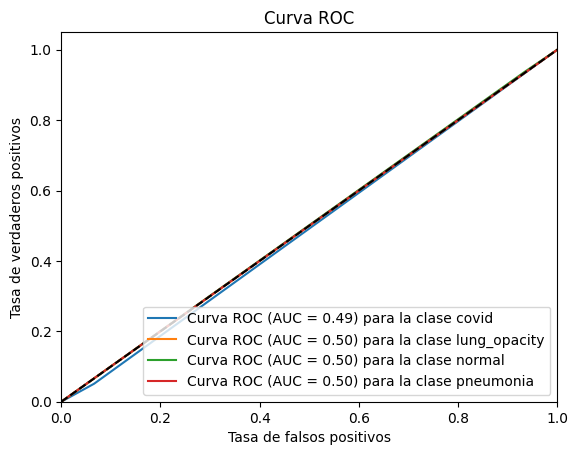

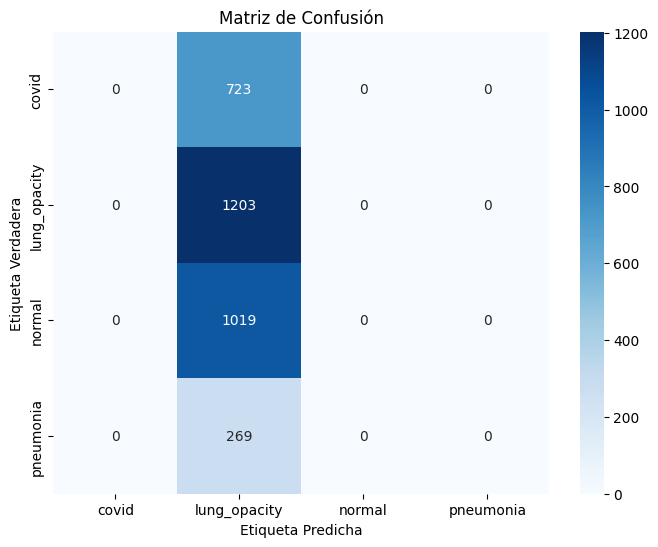

In [8]:
######################################## Tercera Arquitectura ########################################

# Crear el modelo MLP
model = tf.keras.Sequential([
    layers.Flatten(input_shape=(244, 244, 3)),  # Aplanar la imagen en un vector 1D
    layers.Dense(128, activation="tanh"),
    layers.Dense(32, activation="tanh"),
    layers.Dense(4, activation='softmax')  # 4 clases de etiquetas
])

# Compilar el modelo
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Entrenar el modelo
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Predecir las etiquetas para los datos de prueba
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Calcular las métricas para cada clase
report = classification_report(y_test, y_pred_classes, target_names=label_encoder.classes_)

# Imprimir el informe de clasificación
print(report)

# Obtener las probabilidades de predicción para cada clase
y_pred_proba = model.predict(X_test)

fpr = dict()  # Tasa de falsos positivos
tpr = dict()  # Tasa de verdaderos positivos
roc_auc = dict()  # Área bajo la curva (AUC)

# Calcular la curva ROC y el AUC para cada clase
for i in range(4):  # Suponiendo que tienes 4 clases
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Graficar la curva ROC
plt.figure()
for i in range(4):  # Suponiendo que tienes 4 clases
    plt.plot(fpr[i], tpr[i], label='Curva ROC (AUC = %0.2f) para la clase %s' % (roc_auc[i], label_encoder.classes_[i]))
plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred_classes)

# Obtener los nombres de las etiquetas originales
etiquetas_originales = label_encoder.inverse_transform(np.unique(y_test))

# Crear un mapa de calor de la matriz de confusión con etiquetas originales
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=etiquetas_originales, yticklabels=etiquetas_originales)
plt.title('Matriz de Confusión')
plt.xlabel('Etiqueta Predicha')
plt.ylabel('Etiqueta Verdadera')
plt.show()


# Modelo MLP - Sin feature extractor

In [3]:
############################### Cargar los datos de prueba #######################

# Leer el dataset desde un archivo CSV o cargarlo directamente en un DataFrame
df = pd.read_csv('../DataSetPatrones/MetadataNormalizada.csv')

# Dividir los datos en características (X) y etiquetas (y)
X = df['file_paths']
y = df['labels']

# Codificar las etiquetas como valores numéricos
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42,stratify=y)

# Preprocesar los datos de las imágenes en paralelo
#n_jobs=-1 son la cantidad de nucleos disponibles en su compu 
def preprocess_image_parallel(file_paths):
    return Parallel(n_jobs=2)(delayed(preprocess_image)(file_path) for file_path in file_paths)

# Preprocesar los datos de las imágenes
def preprocess_image(file_path):
    img = cv2.imread(file_path)
    img = cv2.resize(img, (244, 244))  # Redimensizonar las imágenes a 64x64
    img = img / 255.0  # Normalizar los valores de píxeles entre 0 y 1
    return img
  
#/content/drive/MyDrive/CE/Introduccion a patrones/Proyecto_2/DataSetPatrones/X_Data/X_test.npy
#/content/drive/MyDrive/CE/Introduccion a patrones/Proyecto_2/DataSetPatrones/X_Data/X_train.npy
X_train = np.array(preprocess_image_parallel(X_train))
X_test = np.array(preprocess_image_parallel(X_test))


Epoch 1/6


C:\Users\J. Zaet\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


327/327 [==============================] - 45s 128ms/step - loss: 5.3052 - accuracy: 0.4897 - val_loss: 1.3134 - val_accuracy: 0.6339
Epoch 2/6
327/327 [==============================] - 27s 82ms/step - loss: 1.5976 - accuracy: 0.5591 - val_loss: 1.0639 - val_accuracy: 0.6289
Epoch 3/6
327/327 [==============================] - 24s 73ms/step - loss: 1.0606 - accuracy: 0.6157 - val_loss: 1.0678 - val_accuracy: 0.6010
Epoch 4/6
327/327 [==============================] - 26s 79ms/step - loss: 0.9698 - accuracy: 0.6185 - val_loss: 0.9010 - val_accuracy: 0.6086
Epoch 5/6
327/327 [==============================] - 24s 74ms/step - loss: 0.8506 - accuracy: 0.6479 - val_loss: 0.9035 - val_accuracy: 0.6010
Epoch 6/6
82/82 [==============================] - 2s 8ms/step
              precision    recall  f1-score   support

       covid       0.78      0.38      0.51       723
lung_opacity       0.59      0.74      0.66       603
      normal       0.69      0.83      0.75      1019
   pneumonia  

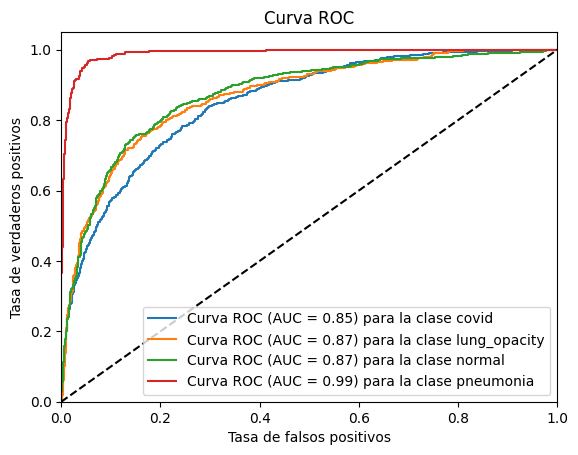

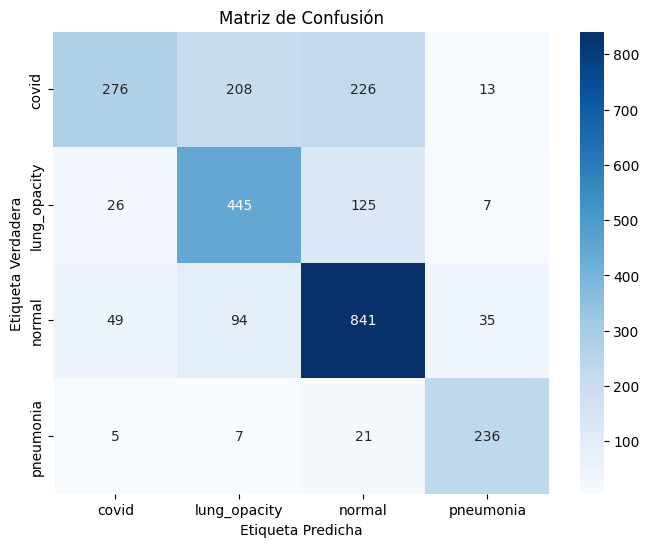

In [4]:
############################################ Arquitectura ##################################

# Crear el modelo MLP
model = tf.keras.Sequential([
    layers.Flatten(input_shape=(244, 244, 3)),  # Aplanar la imagen en un vector 1D
    layers.Dense(64, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(4, activation='softmax')  # 4 clases de etiquetas
])

# Compilar el modelo
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Entrenar el modelo
model.fit(X_train, y_train, epochs=6, batch_size=32, validation_data=(X_test, y_test))

# Predecir las etiquetas para los datos de prueba
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Calcular las métricas para cada clase
report = classification_report(y_test, y_pred_classes, target_names=label_encoder.classes_)

# Imprimir el informe de clasificación
print(report)

# Obtener las probabilidades de predicción para cada clase
y_pred_proba = model.predict(X_test)

fpr = dict()  # Tasa de falsos positivos
tpr = dict()  # Tasa de verdaderos positivos
roc_auc = dict()  # Área bajo la curva (AUC)

# Calcular la curva ROC y el AUC para cada clase
for i in range(4):  # Suponiendo que tienes 4 clases
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Graficar la curva ROC
plt.figure()
for i in range(4):  # Suponiendo que tienes 4 clases
    plt.plot(fpr[i], tpr[i], label='Curva ROC (AUC = %0.2f) para la clase %s' % (roc_auc[i], label_encoder.classes_[i]))
plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred_classes)

# Obtener los nombres de las etiquetas originales
etiquetas_originales = label_encoder.inverse_transform(np.unique(y_test))

# Crear un mapa de calor de la matriz de confusión con etiquetas originales
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=etiquetas_originales, yticklabels=etiquetas_originales)
plt.title('Matriz de Confusión')
plt.xlabel('Etiqueta Predicha')
plt.ylabel('Etiqueta Verdadera')
plt.show()



# Visualización de Mapas de Calor

82/82 [==============================] - 1s 7ms/step


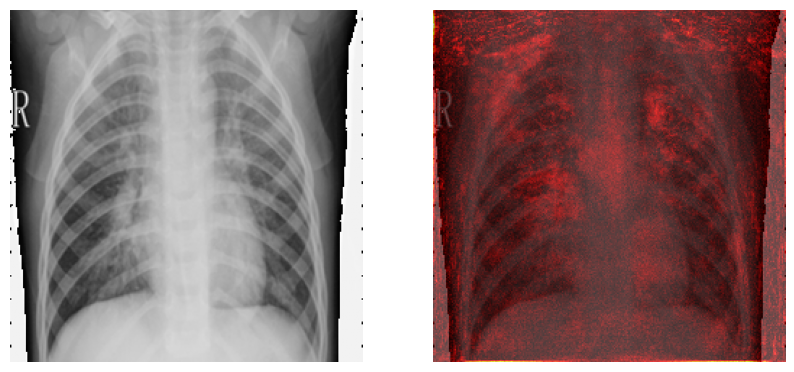

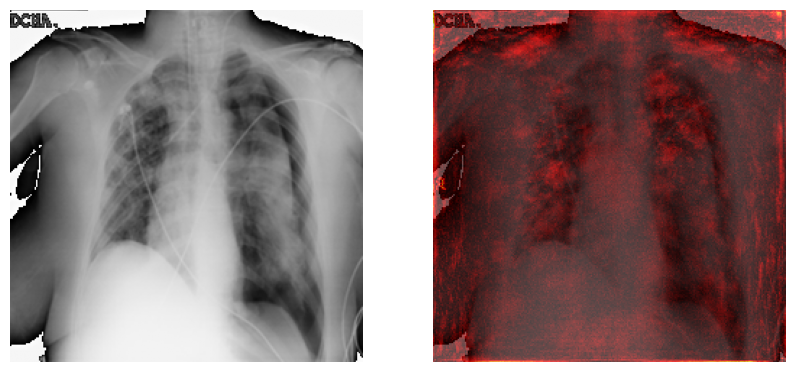

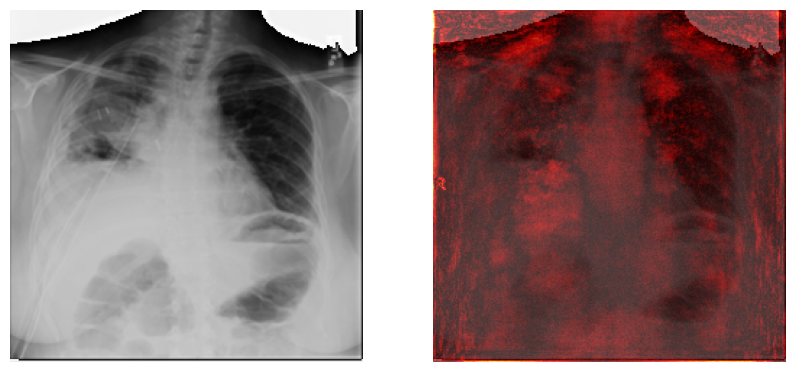

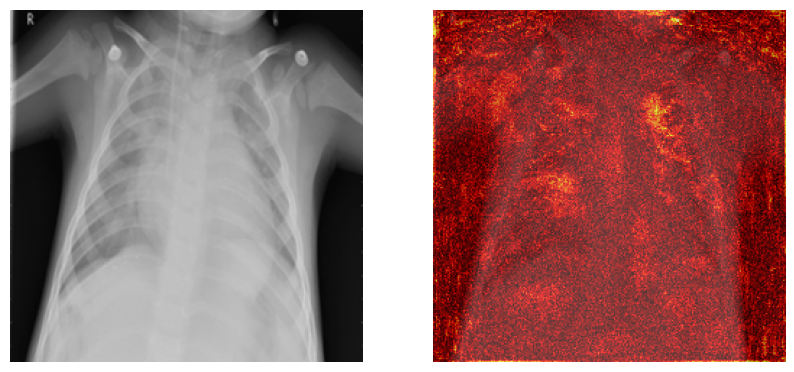

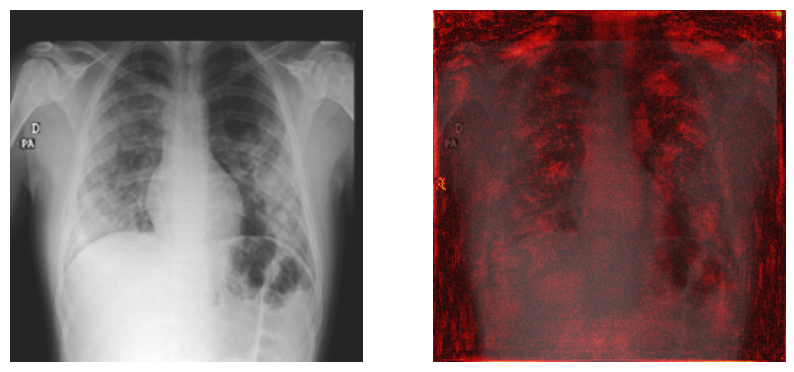

...

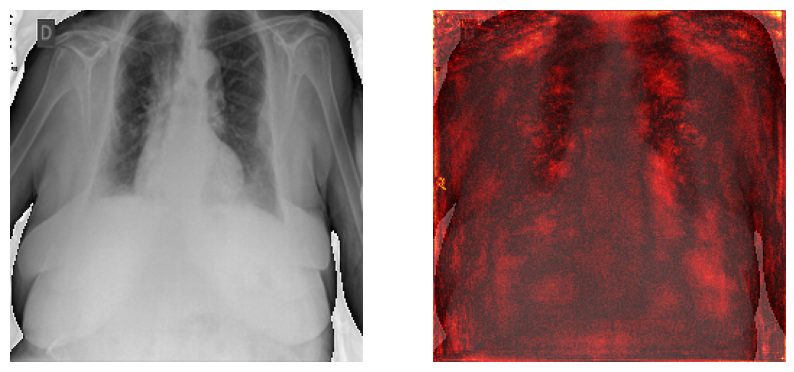

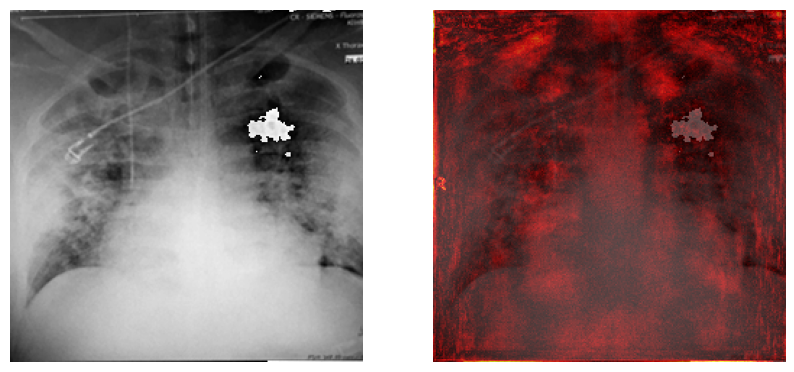

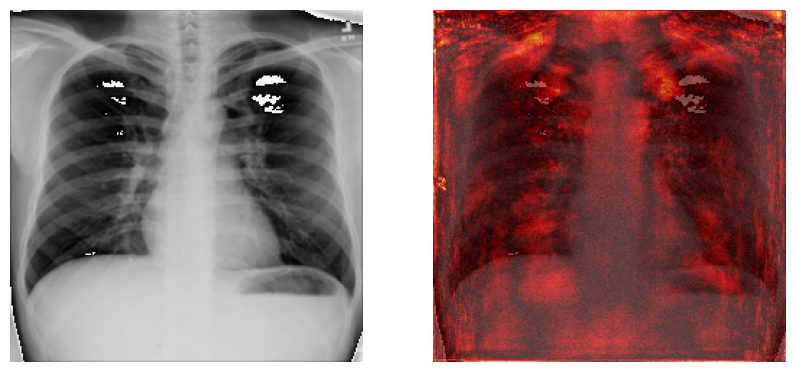

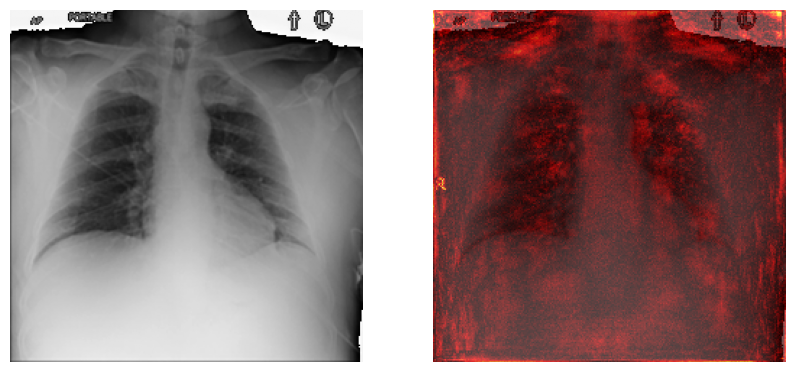

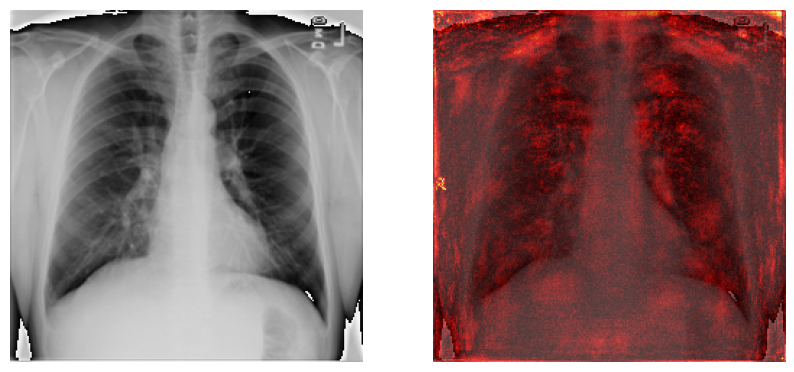

In [5]:
# Obtener predicciones del modelo
predictions = model.predict(X_test)

# Calcular Saliency Maps
def compute_saliency_maps(images, target_class_index):
    images = tf.convert_to_tensor(images)
    with tf.GradientTape() as tape:
        tape.watch(images)
        predictions = model(images)
        target_class_predictions = predictions[:, target_class_index]
    gradients = tape.gradient(target_class_predictions, images)
    saliency_maps = tf.reduce_max(tf.abs(gradients), axis=-1)
    return saliency_maps

target_class_index = 0  # Índice de la clase objetivo
saliency_maps = compute_saliency_maps(X_test, target_class_index)

# Visualizar Saliency Maps superpuestas en imágenes (solo 10 imágenes)
def visualize_saliency_maps(images, saliency_maps, num_images=10):
    for i in range(num_images):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(images[i])
        ax1.axis('off')
        ax2.imshow(images[i])
        ax2.imshow(saliency_maps[i], cmap='hot', alpha=0.7)
        ax2.axis('off')
        plt.show()

visualize_saliency_maps(X_test, saliency_maps, num_images=30)